# План работы

1. Изучение данных
2. Предобработка данных
3. Анализ данных
4. Детализация исследования: открытие кофейни
5. Вывод

## Изучение данных

Загрузим данные о заведениях общественного питания Москвы.

In [1]:
# Для начал загрузим необходимые библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
# Загрузим данные и сохраним в датафрейм df
try:
    df = pd.read_csv('/datasets/moscow_places.csv')
    print('Данные успешно загружены')
except:
    print('Не удалось загрузить данные')

Данные успешно загружены


Изучим общую информацию о датафрейме.

In [3]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В таблице 14 столбцов, из которых 7 имеют тип данных `object`, 6 - `float64`, 1 - `int64`.
Рассмотрим каждый столбец в отдельности:
- `name` — название заведения - тип данных соответствует;
- `category` — категория заведения - тип данных соответствует;
- `address` — адрес заведения - тип данных соответствует;
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `hours` — информация о днях и часах работы - тип данных соответствует;
- `lat` — широта географической точки, в которой находится заведение - тип данных соответствует;
- `lng` — долгота географической точки, в которой находится заведение - тип данных соответствует;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах - тип данных соответствует;
- `price` — категория цен в заведении - тип данных соответствует;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона - тип данных соответствует;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт» - тип данных соответствует;
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино» - взглянем на данные, при возможности уберем дробную часть у значений и приведем к типу данных `int64`;
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым - тип данных соответствует;
- `seats` — количество посадочных мест - уберем дробную часть у значений и приведем к типу данных `int64`.

Всего в датафрейме содержится информация о 8406 заведениях. Посмотрим количество уникальных заведений.

In [5]:
f'В дата фрейме содержится информация о {df["name"].nunique()} уникальных заведениях.'

'В дата фрейме содержится информация о 5614 уникальных заведениях.'

В данном разделе мы загрузили необходимые нам библиотеки. Также подгрузили файл с данными, проверили корректность его загрузки и изучили общую информацию о нем.

## Предобработка данных

Для начала приведем столбец `seats` к типу данных `Int64`. После чего еще раз изучим информацию о датафрейме.

In [6]:
# Приводим к типу данных Int64
df['seats'] = df['seats'].astype('Int64')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   Int64  
dtypes: Int64(1), float64(5), int64(1), object(7)
memory usage: 927.7+ KB


Проверим датафрейм на наличие пропущенных значений, дубликатов и аномалий. 

Начнем с пропущенных значений.

In [8]:
# Найдем количесвто пропущеных значений и выведем их долю
display(df.isna().sum())
pd.DataFrame(df.isna().mean()*100).style.set_precision(1).background_gradient('coolwarm')

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

,0
name,0.0
category,0.0
address,0.0
district,0.0
hours,6.4
lat,0.0
lng,0.0
rating,0.0
price,60.6
avg_bill,54.6


<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

Здорово, что оцениваешь доли пропущенных значений, ведь так гораздо быстрее понять где больше всего пропусков.

</div>

В основной информации о заведениях пропусков нет. Всего в 6 столбцах из 14 обнаружены пропуски, которые несут в себе исключительно справочный характер, и заполнять их значениями на основании других заведений, имеется ввиду сетевых, не корректно, ввиду того, что информация могла быть добавлена пользователями или найдена в общедоступных источниках.

Теперь проверим на наличие дубликатов.

In [9]:
# Проверим наш датафрейм на наличие явных дубликатов
df.duplicated().sum()

0

In [10]:
# Проверим некоторые столбцы на наличие неявных дубликатов
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [11]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Так как визуально проверить корректность написания всех заведений мы не можем, и тем самым выявить неявные дубликаты в паре *name-address*, то приведем все названия к единому стилю.

In [12]:
# Приведем все к нижнему регистру и удалим возможные пробелы в начале и в конце названий
df['name'] = df['name'].str.lower() 
df['name'] = df['name'].str.strip() 

#Заменим ё на е
df['name'] = df['name'].str.replace('ё', 'е')

# Также я обратил внимание, что доминос пицца пишется по разному, приведем все к единому названию
df.loc[(df['name'].str.contains("домино")) & (df['name'].str.contains("пицца")), 'name'] = 'доминос пицца'

In [13]:
# Посмотрим сколько уникальных заведений стало после отбработки
df["name"].nunique()

5505

In [14]:
# Проверим наличие дубликатов в связке name-address
df[df.duplicated(subset=['name', 'address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276


In [15]:
# Поочередно изучим данные дубликаты
df.query('name == "more poke" and address == "Москва, Волоколамское шоссе, 11, стр. 2"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188


In [16]:
df.query('name == "раковарня клешни и хвосты" and address == "Москва, проспект Мира, 118"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150


In [17]:
df.query('name == "хлеб да выпечка" and address == "Москва, Ярцевская улица, 19"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276


Отличие в этих дубликатах, только во времени работы и в столбце, где заведение относится к сетевым или нет. Так как наверняка мы не знаем часы работы того илииного заведения, то оставим первое значение, удалив дуликаты.

In [18]:
# Зафиксируем размер датафрейма до удаления
df.shape[0]

8406

In [19]:
# Удалим дубликаты и проверим количесвто удаленых строк
df = df.drop_duplicates(subset=['name', 'address'])
df.shape[0]

8403

В датафрейме встречаются заведения, которые сразу относятся к несетевым и к сетевым. Найдем данные заведения и отнесем к сетевым. Для начала зафиксируем количесвто заведений которое относится к сетевым.

In [20]:
df.groupby('chain').agg({'name':'count'})

,name
chain,
0,5200
1,3203


In [21]:
temp = df.groupby('name')['chain'].nunique().reset_index().sort_values('chain', ascending=False)
temp_list = temp.query('chain == 2')['name'].to_list()
df.loc[df.query('name in @temp_list').index, 'chain'] = 1

In [22]:
df.groupby('chain').agg({'name':'count'})

,name
chain,
0,5151
1,3252


49 заведений оказались одновременно и сетевыми и не сетевыми. 

Теперь проверим данные на наличие аномалий.

In [23]:
# Посмотрим на количественные значения
df.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8403.000000,8403.000000,8403.000000,3149.000000,535.000000,8403.000000,4792.000000
mean,55.750096,37.608604,4.229894,958.053668,174.721495,0.387005,108.361436
std,0.069664,0.098583,0.470426,1009.732845,88.951103,0.487094,122.841130
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705018,37.538637,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753407,37.605260,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795028,37.664810,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


В столбцах `lat`,`lng`,`rating` и `chain` - аномалий не замечено.
В столбцах`middle_avg_bill`,`middle_coffee_cup` и `seats` видим аномальные зачение, взглянем на диаграммы размаха.

 99% процентов данных не превышают значение 3750.0 рублей


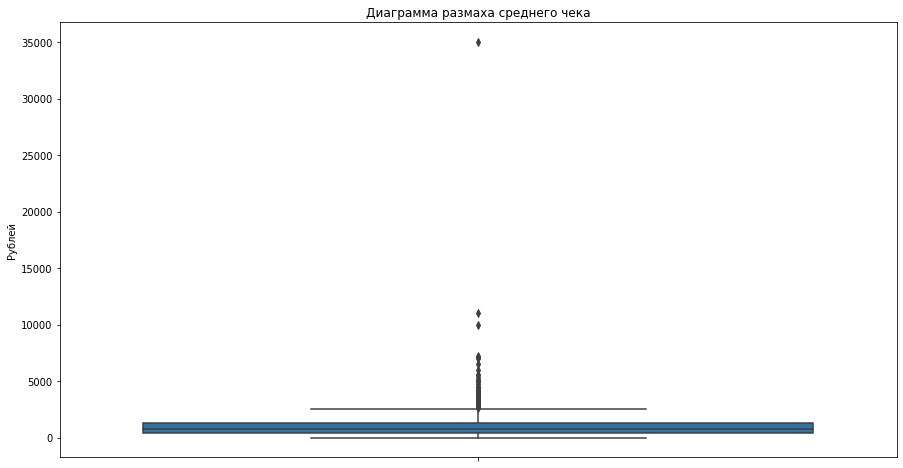

In [24]:
# Взглянем на столбец middle_avg_bill
print(f' 99% процентов данных не превышают значение {df["middle_avg_bill"].quantile(0.99)} рублей') 
plt.figure(figsize=(15, 8))
sns.boxplot(y='middle_avg_bill',data=df)
plt.title('Диаграмма размаха среднего чека')
plt.ylabel('Рублей')
plt.show()

Исходя из диаграммы размаха видим, что есть 1 заведение, где средний чек равен 35000 рублей. Ознакомимся с даныйм заведением. 

In [25]:
df[(df['middle_avg_bill'] > 20000)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
7177,кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.65745,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100


Данное значение выглядит аномально, здесь может быть ошибка в заполнении данных, например, средний чек равен 3500, или все таки средный чек и правда такой высокий. Данную аномалию удалять не будем, так как данный столбец несет справочный характер. При анализе среднего чека, просто исключим данное заведение. 

 99% процентов данных не превышают значение 310 рублей


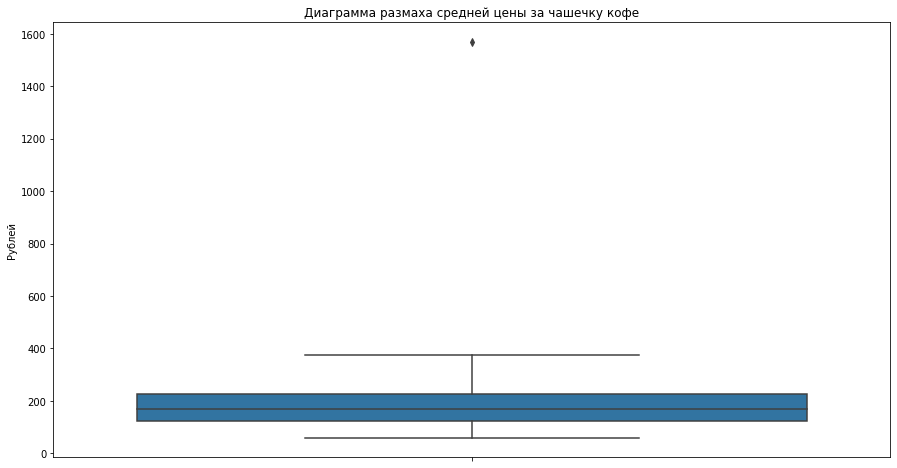

In [26]:
# Взглянем на столбец middle_coffee_cup
print(f' 99% процентов данных не превышают значение {round(df["middle_coffee_cup"].quantile(0.99))} рублей') 
plt.figure(figsize=(15, 8))
sns.boxplot(y='middle_coffee_cup',data=df)
plt.title('Диаграмма размаха средней цены за чашечку кофе')
plt.ylabel('Рублей')
plt.show()

Всего 1 значение выходит за рамки диаграммы размаха. Взглянем на эту строку.

In [27]:
df[(df['middle_coffee_cup'] > 600)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48


В данной строке явно ошибка при заполнении данных в столбце `avg_bill`. Максимальная цена равна 290 рублей. Исправим значения данной строчки в столбцах `avg_bill` и `middle_coffee_cup`.

In [28]:
df.loc[2859, ['avg_bill', 'middle_coffee_cup']] = ['Цена чашки капучино:230–290 ₽', (230+290)/2]

In [29]:
# Взглянем корректно ли прошло изменение
df.loc[2859]

name                                                    шоколадница
category                                                    кофейня
address              Москва, Большая Семёновская улица, 27, корп. 1
district                           Восточный административный округ
hours                                        ежедневно, 08:00–23:00
lat                                                       55.782268
lng                                                       37.709022
rating                                                          4.2
price                                                       средние
avg_bill                              Цена чашки капучино:230–290 ₽
middle_avg_bill                                                 NaN
middle_coffee_cup                                             260.0
chain                                                             1
seats                                                            48
Name: 2859, dtype: object

Посмотрим на количество посадочных мест

 99% процентов данных не превышают значение 625.0 посадочных мест


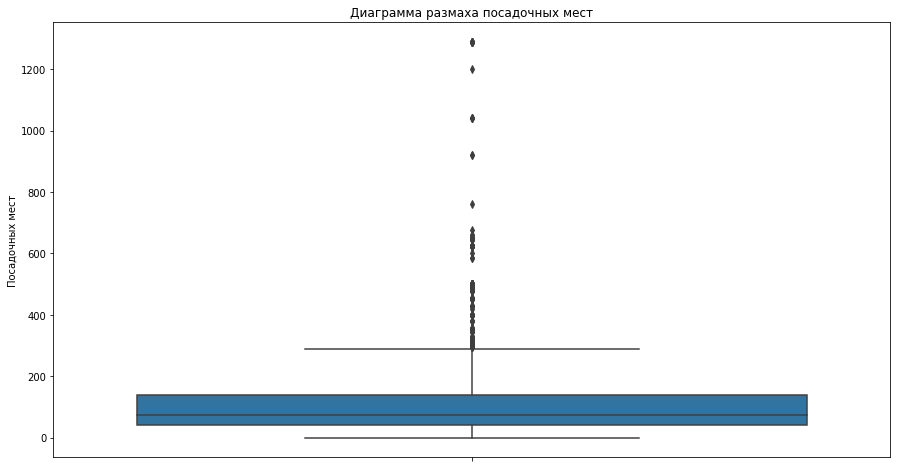

In [30]:
print(f' 99% процентов данных не превышают значение {df["seats"].quantile(0.99)} посадочных мест') 
plt.figure(figsize=(15, 8))
sns.boxplot(y='seats',data=df)
plt.title('Диаграмма размаха посадочных мест')
plt.ylabel('Посадочных мест')
plt.show()

В столбце `seats` наблюдается большое количесвто аномальных значений. Здесь могут быть ошибки при заполнении данных. Аналогично со столбцом `middle_avg_bill` мы его никак не будем обрабатывать, но будем иметь ввиду при анализе.

Создадим столбец `street` с названиями улиц из столбца с адресом.

In [31]:
# Применим лямбда функцию, где пройдемся по каждому элементу с адресом и разобъем на список
# из списка заберем 2оq элемент - улицу
df['street'] = df['address'].apply(lambda x: x.split(', ')[1])

```python
data['address'].str.split(', ').str[1]
```

Создадим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

In [32]:
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')

# Посмотрим на полученные значения
df['is_24/7'].value_counts()

False    7138
True      730
Name: is_24/7, dtype: int64

В данном разделе была проведена предобработка данных. Пропущенные значения в данном случае остались без обработки, ввиду того, что они несут в себе исключительно справочный характер, и заполнять их значениями на основании других заведений было бы неккоректно. Найденые дубликаты были удалены. Аномальные значения были изучены. Также было создано 2 столбца: `street` и `is_24/7`.

## Анализ данных

Изучим какие категории заведений представлены в данных и как среди них распределены заведения.

In [33]:
# Построим сводную таблицу
catering_by_category = (
    df.pivot_table(index='category', values='name', aggfunc='nunique')
    .sort_values('name', ascending=False).reset_index()
)
catering_by_category.columns = ['category', 'cnt']
catering_by_category['share'] = round(catering_by_category['cnt'] / catering_by_category['cnt'].sum() *100, 1)
catering_by_category

,category,cnt,share
0,кафе,1740,29.2
1,ресторан,1537,25.8
2,кофейня,825,13.8
3,"бар,паб",679,11.4
4,быстрое питание,442,7.4
5,пиццерия,360,6.0
6,столовая,242,4.1
7,булочная,138,2.3


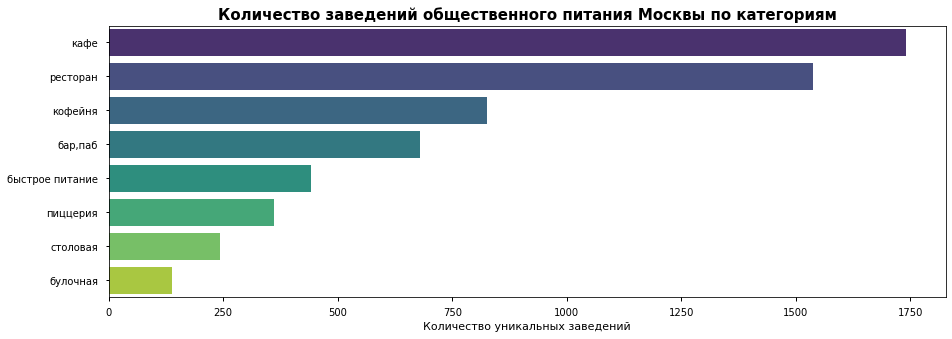

In [34]:
# Визуализируем данные
plt.figure(figsize=(15, 5))
with plt.style.context('seaborn-notebook'):
    sns.barplot(x='cnt', y='category', data=catering_by_category, palette='viridis')
plt.title('Количество заведений общественного питания Москвы по категориям', weight='bold', size=15)
plt.xlabel('Количество уникальных заведений')
plt.ylabel('')
plt.show()

Всего в нашем датафрейме представлено 8 категорий общественного питания. Большая часть заведений позиционирую себя как кафе. Они составляют 29.2% от общего числа исследуемых заведений. На втором месте, с отрывом в 3.4 п.п. находятся категория рестораны. Меньше всего заведений приходится на категорию булочная - 2.3%.

Исследуем количество посадочных мест в местах по категориям.

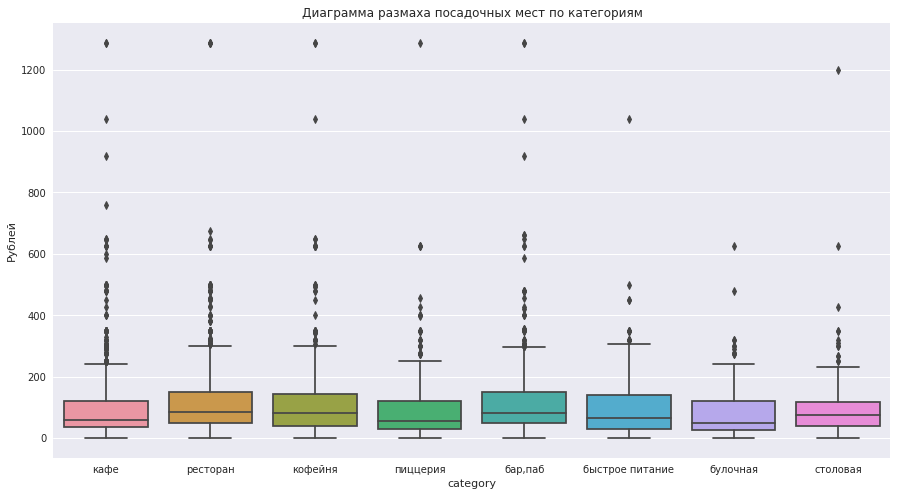

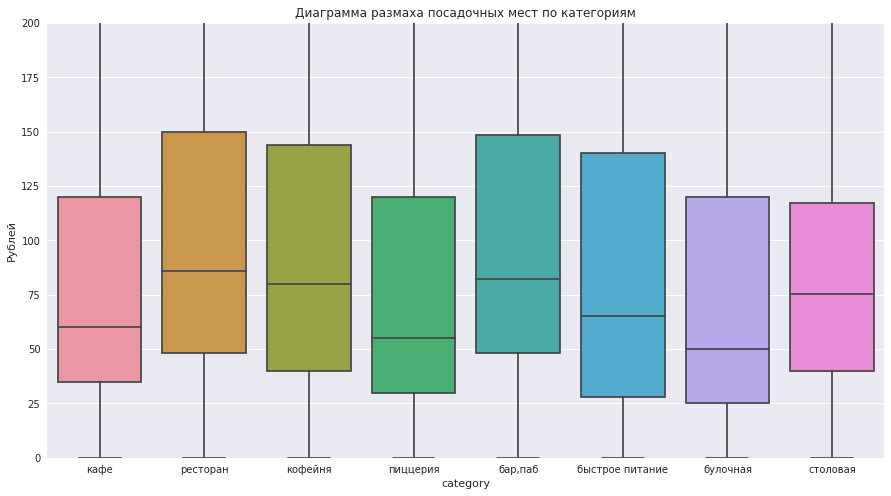

In [35]:
# Построим ящик с усами
with plt.style.context('seaborn'):
    plt.figure(figsize=(15, 8))
    sns.boxplot(x='category', y='seats',data=df)
plt.title('Диаграмма размаха посадочных мест по категориям')
plt.ylabel('Рублей')
plt.show()

# Приблизим ящик
with plt.style.context('seaborn'):
    plt.figure(figsize=(15, 8))
    sns.boxplot(x='category', y='seats',data=df)
plt.title('Диаграмма размаха посадочных мест по категориям')
plt.ylabel('Рублей')
plt.ylim(0, 200)
plt.show()

Благодаря диаграмме размаха, можно заметить, что в основном у заведений от 25 до 150 посадочных мест. Медианное значение варьируется от 50 до 85 мест. Больше всего мест в ресторанах и барах, пабах. На третьем месте кофейни. Также видно, что в некоторых категориях есть заведения, в которых более 1200 посадочных мест. На этапе предобработки данных были выявлены такие аномалии, но узнать наверняка является это выбросом или актуальной информацией, можно только вручную, так как большая часть информации в нашем датарейме заполняется пользователями вручную.

Взглянем на соотношение сетевых и несетевых заведений.

In [36]:
temp = df.groupby('chain').agg({'name':'count'}).reset_index()
fig = go.Figure(data=[go.Pie(
    labels=['Несестевое', 'Сетевое'],
    values=temp['name'],
    textinfo='percent')])
fig.update_layout(
    title="Соотношение сетевых и несетевых заведений",
    title_x = 0.47)
fig.show()

В нашем датасете представлено больше несетевых заведений, чем сетевых.

Посмотрим как распределены сетевые и несетевые заведения по категориям.

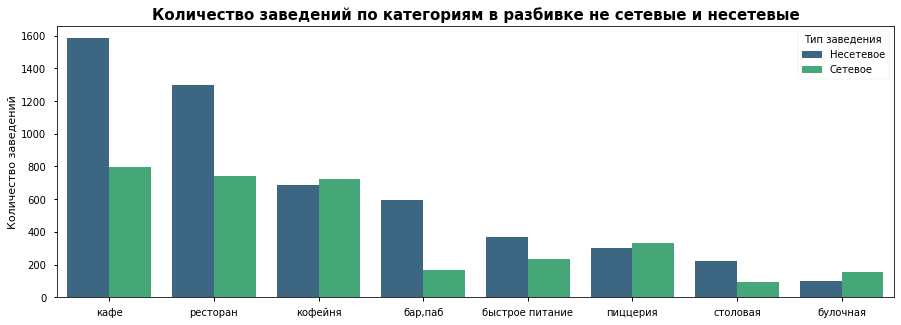

In [37]:
# Сделаем сводную таблицу
temp = df.pivot_table(index=['category', 'chain'], values='name', aggfunc='count').sort_values('name', ascending=False).reset_index()
temp.loc[temp['chain'] == 0,'chain'] = 'Несетевое'
temp.loc[temp['chain'] == 1,'chain'] = 'Сетевое'
temp.columns = ['category', 'Тип заведения', 'name']

plt.figure(figsize=(15, 5))
with plt.style.context('seaborn-notebook'):
    sns.barplot(x='category', y='name', hue='Тип заведения', data=temp, palette='viridis')
plt.title('Количество заведений по категориям в разбивке не сетевые и несетевые', weight='bold', size=15)
plt.xlabel('')
plt.ylabel('Количество заведений')
plt.show()

Кофейни, пиццерии и булочные - чаще являются сетевыми, нежели другие категории общественного питания.

Найдем топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе.

In [38]:
# Сделаем срез с сетевыми заведениями
rest_chain = df.query('chain == 1')
top_rest_chain = (
    rest_chain.groupby(['name', 'category']).agg({'chain':'count'})
    .sort_values('chain', ascending=False).reset_index().head(15)
)
top_rest_chain.columns = ['name', 'category', 'number']
top_rest_chain

,name,category,number
0,шоколадница,кофейня,119
1,доминос пицца,пиццерия,78
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,72
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,36


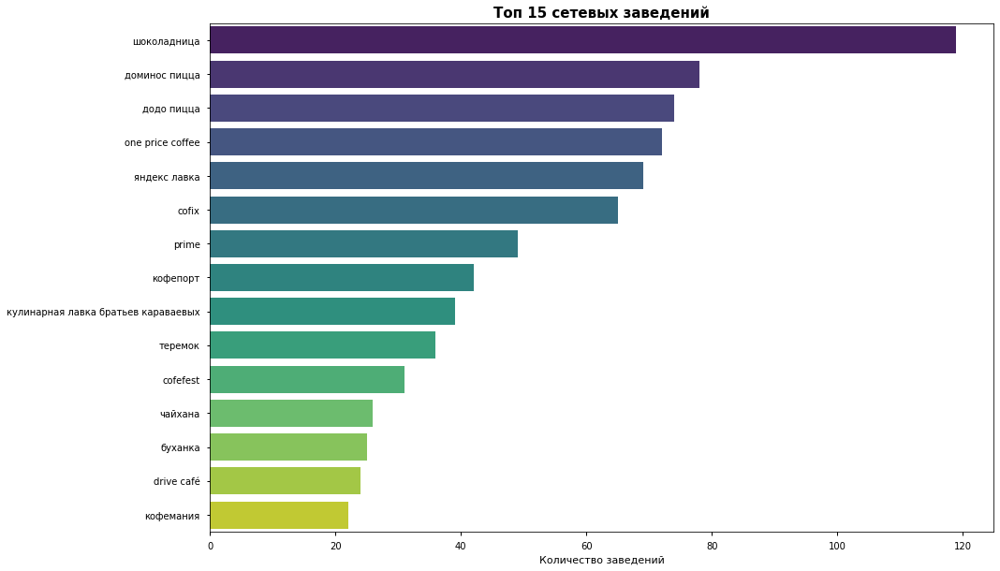

In [39]:
# Данный график для презентации
plt.figure(figsize=(15, 10))
with plt.style.context('seaborn-notebook'):
    sns.barplot(x='number', y='name', data=top_rest_chain, palette='viridis')
plt.title('Топ 15 сетевых заведений', weight='bold', size=15)
plt.xlabel('Количество заведений')
plt.ylabel('')
plt.show()

In [40]:
# Для удобства построения графика, завернем все в сводную таблицу
gg = top_rest_chain.pivot_table(index='category', columns='name', values='number')

# Построим накопительную диаграмму в разбивке по категориям
fig = px.bar(
    gg, 
    labels={'value':'Количетсво ресторанов', 'category':'', 'name':'Название заведения'},
    title='Топ 15 сетевых ресторанов в разбивке по категориям'
)
fig.update_layout(
    title={
        'x':0.5}
)
fig.show()


Больше всего заведений относятся к категории "кофейня", далее идут "пиццерия" и "ресторан". В категории "кафе" - 89 заведений. В категории "булочная" всего 1 сеть из 25 заведений.

Посмотрим какие административные районы Москвы присутствуют в датасете и отобразим их общее количество заведений и количество заведений каждой категории по районам.

In [41]:
# Сгруппируем данные по районам rest_by_disrict = rbd и total_rest_by_district = trbd
rbd = df.groupby(['district', 'category']).agg({'name':'count'}).reset_index()
trbd = rbd.groupby('district').agg({'name':'sum'}).reset_index()

# Добавим данные по категории с пометкой Общее количесвто заведений
trbd['category'] = 'Общее количество заведений'

# Соеденим 2 датафрейма summary_rest_by_disrtict = srbd
srbd = pd.concat([rbd, trbd]).sort_values(['district', 'name']).reset_index(drop=True)

# Проверим корректность присоединения
srbd.head(10)

,district,category,name
0,Восточный административный округ,булочная,25
1,Восточный административный округ,столовая,40
2,Восточный административный округ,"бар,паб",53
3,Восточный административный округ,быстрое питание,71
4,Восточный административный округ,пиццерия,72
5,Восточный административный округ,кофейня,105
6,Восточный административный округ,ресторан,160
7,Восточный административный округ,кафе,272
8,Восточный административный округ,Общее количество заведений,798
9,Западный административный округ,столовая,24


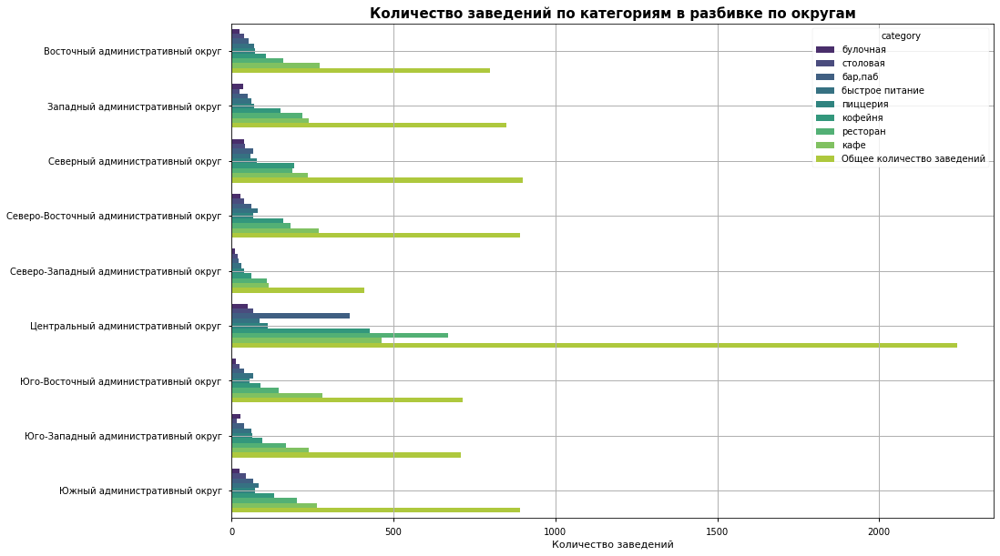

In [42]:
plt.figure(figsize=(15, 10))
with plt.style.context('seaborn-notebook'):
    ax = sns.barplot(y='district', x='name', hue='category', data=srbd, palette='viridis')
plt.title('Количество заведений по категориям в разбивке по округам', weight='bold', size=15)
plt.ylabel('')
plt.xlabel('Количество заведений')
plt.grid(True)
plt.show()

В ЦАО открыто более 2000 заведений общественного питания, из них больше всего ресторанов. Меньше всего заведений находится в СЗАО - менее 500. В остальных округах количество заведений примерно одинаковое.

Визуализируем распределение средних рейтингов по категориям заведений.

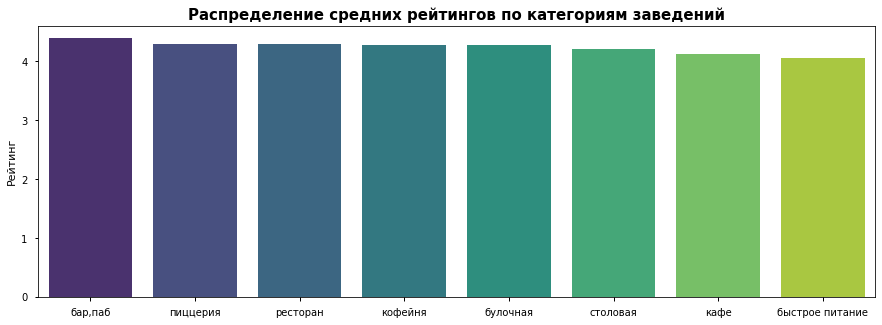

In [43]:
plt.figure(figsize=(15, 5))
with plt.style.context('seaborn-notebook'):
    sns.barplot(
        x='category', 
        y='rating', 
        data=df.groupby('category').agg({'rating':'mean'}).sort_values('rating', ascending=False).reset_index(), 
        palette='viridis')
plt.title('Распределение средних рейтингов по категориям заведений', weight='bold', size=15)
plt.xlabel('')
plt.ylabel('Рейтинг')
plt.show()

Как видно из диаграммы, усреднённые рейтинги в разных типах общепита практически не отличаются. В каждой категории есть как плохие отзывы, так и хорошие.

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [44]:
# Посчитаем средний рейтинг заведений по округам
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')
rating_df['rating'] = round(rating_df['rating'], 1)
rating_df

,district,rating
0,Восточный административный округ,4.2
1,Западный административный округ,4.2
2,Северный административный округ,4.2
3,Северо-Восточный административный округ,4.1
4,Северо-Западный административный округ,4.2
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.1
7,Юго-Западный административный округ,4.2
8,Южный административный округ,4.2


In [45]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBuGn',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий средний рейтинг у заведений в ЦАО, котрый равен 4.4. В других округах средний рейтинг варьируется от 4.1 до 4.2.

Отобразим все заведения датасета на карте с помощью кластеров.

In [46]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Найдем топ-15 улиц по количеству заведений и построим график распределения количества заведений и их категорий по этим улицам. 

In [47]:
# Найдем топ 15 улиц по количеству заведений
top_street = df.groupby('street', as_index=False)['name'].agg('count').sort_values('name', ascending=False).head(15)
top_street['category'] = 'общее количество заведений'

# Сгруппируем заведения по улице и категориям и оставим только те улицы, которые входят в топ 15
street_rest_cat = df.groupby(['street', 'category'], as_index=False)['name'].agg('count').sort_values('name', ascending=False)
street_rest_cat = street_rest_cat.query('street in @top_street["street"].to_list()')

# Склеим 2 датафрейма и получим топ 15 улиц по количеству заведений в рабивке по категориям + тотал
top_street_rest_cat = pd.concat([top_street, street_rest_cat]).sort_values('name').reset_index(drop=True)

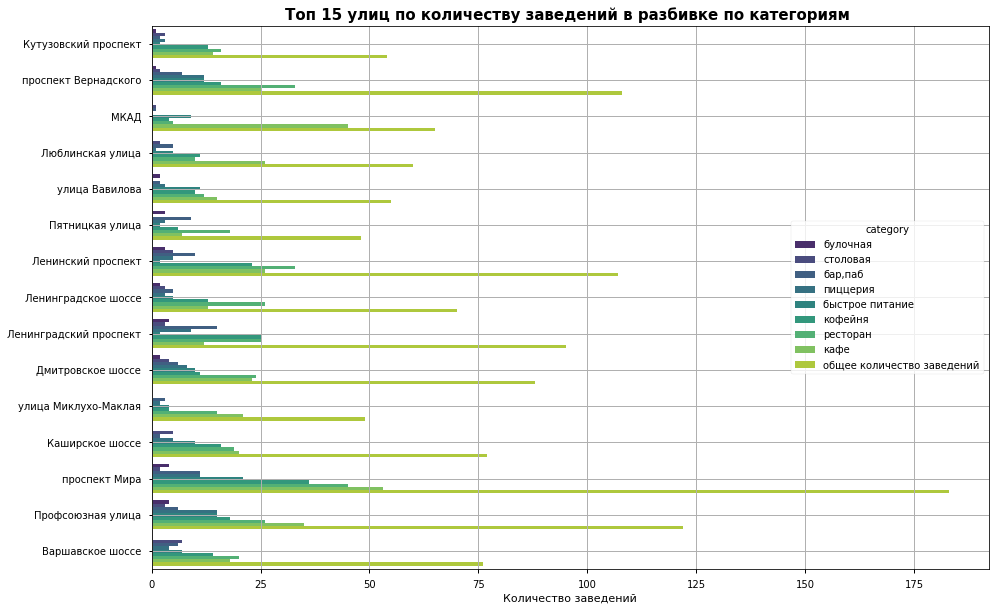

In [48]:
plt.figure(figsize=(15, 10))
with plt.style.context('seaborn-notebook'):
    ax = sns.barplot(y='street', x='name', hue='category', data=top_street_rest_cat, palette='viridis')
plt.title('Топ 15 улиц по количеству заведений в разбивке по категориям ', weight='bold', size=15)
plt.ylabel('')
plt.xlabel('Количество заведений')
plt.grid(True)
plt.show()

Больше всего заведений находится на проспекте Мира, из которых больше всего кафе. Меньше всего точек общественного питания на Пятницкой улице.

Найдем улицы, на которых находится только один объект общепита.

In [49]:
low_street = df.groupby('street', as_index=False)['name'].agg('count').sort_values('name')
low_street = low_street.query('name == 1')
low_street['street'].to_list()
df_low = df.query('street in @low_street["street"].to_list()')
df_low.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,<NA>,Прибрежный проезд,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,<NA>,парк Левобережный,False
58,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,<NA>,Угличская улица,False
60,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,<NA>,ландшафтный заказник Лианозовский,False


Во всей базе нашлось 458 улиц, на которых только 1 заведение общепита.

Изучим значения средних чеков заведений. Посчитаем медиану этих значений для каждого района и отбразим на фоновой картограмме.

In [50]:
df_bill = df[df['middle_avg_bill'].notna()].groupby('district', as_index=False)['middle_avg_bill'].agg('median')
df_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [51]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    legend_name='Медианная стоимость заказов в заведениях по округам',
).add_to(m)

# выводим карту
m

Самые высокие цены в ЦАО, что вполне ожидаемо, и в ЗАО. В остальных районах медианное значение средних чеков находится в диапазоне от 450 до 700 рублей. Так как мы изучаем медианное значение по округам, неполучается отследить динамику изменения цены среднего чека при удалении от центра. По полученным данным, можно утверждать, что в ЦАО и ЗАО цены выше, чем в сотальных округах.

В данном разделе мы изучили данные и получили следующие результаты:
- Большая часть заведений относятся к категории кафе. Они составляют 29.2% от общего числа исследуемых заведений. На втором месте находятся категория рестораны - 25.8%. Меньше всего заведений приходится на категорию булочная - 2.3%.
- В основном у заведений от 25 до 150 посадочных мест. Медианное значение варьируется от 50 до 85 мест.
- Количество сетевых заведений составляет 38.7% от общего числа заведений. Кофейни, пиццерии и булочные - чаще являются сетевыми, нежели другие категории общественного питания.
- Среди сетевых заведений самое большее количество точек у "Шоколадницы" - 119 заведений по Москве
- В ЦАО открыто более 2000 заведений общественного питания, из них больше всего ресторанов. Меньше всего заведений находится в СЗАО - менее 500. В остальных округах количество заведений примерно одинаковое.
- Усреднённые рейтинги в разных типах общепита практически не отличаются. 
- Больше всего заведений находится на проспекте Мира, из которых больше всего кафе. Меньше всего точек общественного питания на Пятницкой улице.
- Самые высокие цены в ЦАО, что вполне ожидаемо, и в ЗАО. В остальных районах медианное значение средних чеков находится в диапазоне от 450 до 700 рублей. 

## Детализируем исследование: открытие кофейни

Попробуем определить, возможно ли открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. 

Посмотрим сколько всего кофеен в датасете и в каких районах их больше всего.

In [52]:
df_cofee = df.query('category == "кофейня"')
f'В датафреме представлено {df_cofee.shape[0]} кофеен'

'В датафреме представлено 1413 кофеен'

In [53]:
# Взглянем по районам
df_cofee.groupby('district', as_index=False).agg({'name':'count'})

,district,name
0,Восточный административный округ,105
1,Западный административный округ,150
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
4,Северо-Западный административный округ,62
5,Центральный административный округ,428
6,Юго-Восточный административный округ,89
7,Юго-Западный административный округ,96
8,Южный административный округ,131


Больше всего кофеен находится в Центральном административном округе - 428, что вполне естественно, ввиду того, что туда приезжают погулять со всей Москвы. Также в центре большой поток туристов. Взглянем на карте, как рассредоточены кофейни по городу.

In [54]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}"
    ).add_to(marker_cluster)
    
# для наглядности выведем границы районов
Choropleth(
    geo_data=state_geo,
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0
).add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
df_cofee.apply(create_clusters, axis=1)

# выводим карту
m

Нет какой то четкой особенности расположения кофеен в Москве, они равномерно рассредоточены по всему городу, за исключением мест, где их открытие невозможно, например, лесопарковые зоны. На выбор места для открытие кофейни влияет много факторов, такие, как проходимость, размер помещения и стоимость его аренды, наличие конкурентов и т.д. 

Посмотримм есть ли круглосуточные кофейни. А также какая у них средняя цена за чашечку капучино и как они расположены.

In [55]:
df_cofee_open = df_cofee[df_cofee['is_24/7'] == True]
f'В датафреме представлено {df_cofee_open.shape[0]} круглосуточных кофеен'

'В датафреме представлено 59 круглосуточных кофеен'

In [56]:
# Взглянем по районам
df_cofee_open.groupby('district', as_index=False).agg({'name':'count'})

Большинство круглосуточных кофеен расположено в центре. Открывать круглосуточные кофейни где-нибудь на окраине не рентабельно, так как там проходимость в ночное время гораздо меньше, чем в центре. Также неоходимо учитывать, будет ли выгодно работать круглосуточно, так как это затраты на зарплаты и электречество.

Посмотрим как круглосуточная работа кофейни повлияет на среднюю стоимость за чашечку капучино.

In [ ]:
open_price = (
    df_cofee_open[df_cofee_open['middle_coffee_cup']
    .notna()].groupby('district', as_index=False)
    .agg({'middle_coffee_cup':'mean'})
)
open_price['all'] = (
    df_cofee[df_cofee['middle_coffee_cup'].notna()]
    .groupby('district', as_index=False)
    .agg({'middle_coffee_cup':'mean'})['middle_coffee_cup']
)
open_price

In [ ]:
plt.figure(figsize=(12, 7))
plt.plot(open_price['district'], open_price['middle_coffee_cup'], alpha=0.7, label="Круглосуточные кофейни", lw=2, mew=2, ms=12)
plt.plot(open_price['district'], open_price['all'], label="Все кофейни", mec='r', lw=2, mew=2, ms=12)
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)

Исходя из полученного график, видно что работа кофейни в ночь, также сказывается на средней стоимости за чашечку капучино.

Посмотрим какие у кофеен рейтинги и как они распределяются по районам.

In [ ]:
df_cofee.groupby('district', as_index=False).agg({'rating':'median'})

Расположение кофейни практически не влияет на рейтинг кофейни.

Еще раз взглянем на среднюю цену за чашечку капучино, чтобы понять на какую стоимость чашки капучино стоит ориентироваться при открытии кофейни.

In [ ]:
cofee_price = (
    df_cofee[df_cofee['middle_coffee_cup']
    .notna()].groupby('district', as_index=False).agg({'middle_coffee_cup':'mean'})
)
cofee_price

In [ ]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cofee_price,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    legend_name='Медианная стоимость чашечки капучино в заведениях по округам',
).add_to(m)

# выводим карту
m

При открытии заведения на среднюю стоимость чашечки капучино влияет множество факторов, один из них, расположение кофейни, видно, что в ЦАО, ЮЗАО и ЗАО, средняя цена за чашечку капучино выше, чем в остальных районах. Также при установке цены следует учитывать стоимость аренды помещения, стоимость зерен кофе и молока и т.д.

Открытие нового "noname" заведения, и сделать его популярным и доступным, задача непростая, но осущиствимая. При выборе места для открытия необходимо изучить множество факторов, такие как проходимость, аренда и размер помещения, район и т.д. Я бы предложил, рассмотреть ЦАО, несмотря на высокую конкурентность, проходимость в этом районе, гораздо выше, чем в остальных, а также до него будет удобно добраться со всех концов Москвы. Перед принятием решения, стоит ли делать кофейню круглосуточной, стоит учитывать, что это несет дополнительные траты и тем самым цена в заведении будет выше, чем некруглосуточных заведениях, что делает кофейню уже не такой доступной.

Важно понимать, что популярность и доступность кофейни складывается из множества факторов. Мало изучить расположение и цену конкурентов. Очень немаловажный фактор - это дизайн помещения, индивидуальность меню, ну и концепт заведения. Можно открыть заведение, где люди будут приходить поесть, ну или же где они будут приходить "позависать" или поработать.

## Вывод

Перед нами стояла задача изучить предоставленные нам данные, в которых содержаться данные от заведениях общественного питания города Москвы. Данные были изучени и предобработаны.

В ходе анализа данных были получены следующие результаты:
- Большая часть заведений относятся к категории кафе. Они составляют 29.2% от общего числа исследуемых заведений. На втором месте находятся категория рестораны - 25.8%. Меньше всего заведений приходится на категорию булочная - 2.3%.
- В основном у заведений от 25 до 150 посадочных мест. Медианное значение варьируется от 50 до 85 мест.
- Количество сетевых заведений составляет 38.7% от общего числа заведений. Кофейни, пиццерии и булочные - чаще являются сетевыми, нежели другие категории общественного питания.
- Среди сетевых заведений самое большее количество точек у "Шоколадницы" - 119 заведений по Москве
- В ЦАО открыто более 2000 заведений общественного питания, из них больше всего ресторанов. Меньше всего заведений находится в СЗАО - менее 500. В остальных округах количество заведений примерно одинаковое.
- Усреднённые рейтинги в разных типах общепита практически не отличаются.
- Больше всего заведений находится на проспекте Мира, из которых больше всего кафе. Меньше всего точек общественного питания на Пятницкой улице.
- Самые высокие цены в ЦАО, что вполне ожидаемо, и в ЗАО. В остальных районах медианное значение средних чеков находится в диапазоне от 450 до 700 рублей.

Чтобы дать рекомендации инвесторам из фонда "Shut up and take my money" рекомендации относительно открытия кофейни, мы исследовали рынок и получили следующие результаты:
- В Москве 1413 кофеен;
- Менее 5% работают круглосуточно;
- Больше всего кофеен расположено в ЦАО - 428;
- Рейтинг заведений никак не зависит от района кофейни;
- В ЦАО, ЮЗАО и ЗАО, средняя цена за чашечку капучино выше, чем в остальных районах.

Благодаря проделанному исследованию можно сказать, что открытие нового "noname" заведения, и сделать его популярным и доступным, задача непростая, но осущиствимая. При выборе места для открытия необходимо изучить множество факторов, такие как проходимость, аренда и размер помещения, район и т.д. Я бы предложил, рассмотреть ЦАО, несмотря на высокую конкурентность, проходимость в этом районе, гораздо выше, чем в остальных, а также до него будет удобно добраться со всех концов Москвы. Перед принятием решения, стоит ли делать кофейню круглосуточной, стоит учитывать, что это несет дополнительные траты и тем самым цена в заведении будет выше, чем некруглосуточных заведениях, что делает кофейню уже не такой доступной.

Важно понимать, что популярность и доступность кофейни складывается из множества факторов. Мало изучить расположение и цену конкурентов. Очень немаловажный фактор - это дизайн помещения, индивидуальность меню, ну и концепт заведения.

Презентация: <https://docs.google.com/presentation/d/1oJx8zwTs4x31hQVXNe3ZNeoioq6zbvKj/edit?usp=share_link&ouid=106036108299388794791&rtpof=true&sd=true> 